In [258]:
import sys
sys.path.append('../')

In [397]:
import pandas as pd
import pandas_profiling
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit, train_test_split
from tools.constants import SEED
import tools
import tools.preprocessing as pp_tools
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sns.set()
%matplotlib inline

In [19]:
DATADIR = Path('../data')
RAW_DATADIR = DATADIR / 'raw'

In [20]:
raw_data = tools.read_raw_data(RAW_DATADIR / 'train.csv')

# I - High level exploration and train test split

In [401]:
raw_data = read_raw_data()
raw_data.profile_report()
# raw_data.head()
# raw_data_info = raw_data.info(verbose=True, null_counts=True)

### Comment:
Note that some of the high cardinality variables may actually be more appropriate as continuous variables. Let's make a call and assume that only binary features are categorical. Everything else will be assumed discrete non categorical at this early stage

4    0.627394
2    0.167103
3    0.126504
1    0.079000
Name: Target, dtype: float64

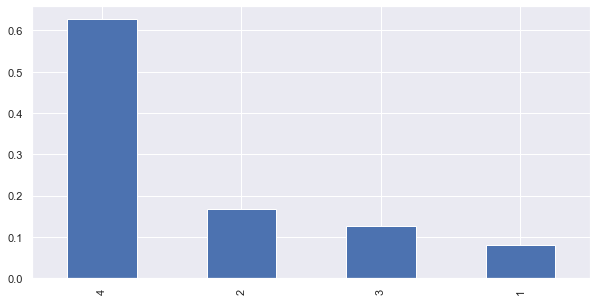

In [180]:
target_dist = raw_data['Target'].astype(np.int).value_counts() / raw_data['Target'].count()
_ = target_dist.plot(kind='bar', figsize=(10, 5));
target_dist

In [187]:
# This will stratify based on the target. Also at this stage, we simply discard the test set.
dataset, _ = tools.train_test_split(raw_data)

# II - Exploration

In [283]:
household_count = dataset['idhogar'].nunique()
print(f'there is {household_count} households in the dataset')

there is 2891 households in the dataset


### Comment:
Most features availables are categorical. Let's check their cardinality.
Let's also split the features by categorical, objects and continuous to have a look.

In [188]:
cardinality = dataset.loc[:, raw_data.dtypes == np.int64].apply(lambda c: c.nunique(), axis='rows')
categorical_cols = cardinality[cardinality == 2].index

In [189]:
categorical_cols

Index(['hacdor', 'hacapo', 'v14a', 'refrig', 'v18q', 'paredblolad',
       'paredzocalo', 'paredpreb', 'pareddes', 'paredmad',
       ...
       'television', 'mobilephone', 'lugar1', 'lugar2', 'lugar3', 'lugar4',
       'lugar5', 'lugar6', 'area1', 'area2'],
      dtype='object', length=101)

In [408]:
categorical_data = dataset.loc[:, categorical_cols]
text_cols = dataset.dtypes == np.object
text_data = dataset.loc[:, text_cols]
continuous_data  = dataset.loc[:, ~(dataset.columns.isin(categorical_cols) | text_cols)]


In [409]:
continuous_data.columns

Index(['v2a1', 'rooms', 'v18q1', 'r4h1', 'r4h2', 'r4h3', 'r4m1', 'r4m2',
       'r4m3', 'r4t1', 'r4t2', 'r4t3', 'tamhog', 'tamviv', 'escolari',
       'rez_esc', 'hhsize', 'elimbasu5', 'hogar_nin', 'hogar_adul',
       'hogar_mayor', 'hogar_total', 'meaneduc', 'bedrooms', 'overcrowding',
       'qmobilephone', 'age', 'SQBescolari', 'SQBage', 'SQBhogar_total',
       'SQBedjefe', 'SQBhogar_nin', 'SQBovercrowding', 'SQBdependency',
       'SQBmeaned', 'agesq', 'Target'],
      dtype='object')

In [414]:
text_data.sort_values('idhogar').head(20)

,Id,idhogar,dependency,edjefe,edjefa
7472,ID_654683e33,001ff74ca,yes,no,16
8161,ID_079963679,003123ec2,yes,6,no
8159,ID_55199c2f3,003123ec2,yes,6,no
8162,ID_99c9bcea5,003123ec2,yes,6,no
6472,ID_ca701e058,004616164,yes,3,no
6607,ID_5ad4372cd,004983866,yes,no,8
7791,ID_700e30a8d,005905417,2,no,9
7792,ID_bc99ecfb8,005905417,2,no,9
7790,ID_308a05a16,005905417,2,no,9
3776,ID_06f0b77fe,006031de3,yes,15,no


### Comments:
Besides the family identifier (idhogar) and id, those features actually mix text and numeric data.

In [193]:
print('dependency:')
pd.unique(text_data['dependency'])
print('edjefe:')
pd.unique(text_data['edjefe'])
print('edjefa:')
pd.unique(text_data['edjefa'])

dependency:


array(['2.5', '4', 'no', '1.5', '2', '.5', '.33333334', '.66666669', '5',
       'yes', '.25', '1.3333334', '3', '8', '1.75', '.2', '.40000001',
       '.75', '.71428573', '2.25', '.80000001', '1.6666666', '3.5',
       '.83333331', '1.25', '.2857143', '.60000002', '6', '1.2',
       '.22222222', '.16666667'], dtype=object)

edjefe:


array(['5', 'no', '6', '2', '9', '4', '14', '11', '16', '17', '10', '7',
       '13', '18', '15', '3', '8', '12', 'yes', '20', '19', '21'],
      dtype=object)

edjefa:


array(['no', '11', '4', '12', '6', '3', '15', '9', '8', '5', '16', '10',
       '7', '14', '13', 'yes', '17', '2', '21', '19', '18', '20'],
      dtype=object)

### Comments:
As the yes/no value is an indicator for the head of the household by gender we could inpute the values of years of education for said person.
Let's NaN the non numerical values for now and have a brief look at the distribution of what remains

In [418]:
dataset[['male', 'female','idhogar', 'parentesco1', 'age', 'dependency', 'edjefe', 'edjefa']]\
    .sort_values('idhogar')\
    .head(50)

,male,female,idhogar,parentesco1,age,dependency,edjefe,edjefa
7472,0,1,001ff74ca,1,38,yes,no,16
8161,1,0,003123ec2,0,1,yes,6,no
8159,0,1,003123ec2,0,23,yes,6,no
8162,1,0,003123ec2,0,3,yes,6,no
6472,1,0,004616164,1,50,yes,3,no
6607,1,0,004983866,0,16,yes,no,8
7791,1,0,005905417,0,14,2,no,9
7792,1,0,005905417,0,6,2,no,9
7790,0,1,005905417,1,32,2,no,9
3776,0,1,006031de3,0,36,yes,15,no


In [276]:
# Look at a few families
dataset.query('idhogar == "5a89adeed"')[['male', 'female','idhogar', 'parentesco1', 'dependency', 'edjefe', 'edjefa']]
dataset.query('idhogar == "a80e1a330"')[['male', 'female','idhogar', 'parentesco1', 'dependency', 'edjefe', 'edjefa']]

,male,female,idhogar,parentesco1,dependency,edjefe,edjefa
7266,0,1,5a89adeed,0,4,no,11
7267,0,1,5a89adeed,1,4,no,11
7265,0,1,5a89adeed,0,4,no,11
7268,0,1,5a89adeed,0,4,no,11
7269,0,1,5a89adeed,0,4,no,11


,male,female,idhogar,parentesco1,dependency,edjefe,edjefa
8199,0,1,a80e1a330,0,1.5,6,no
8200,0,1,a80e1a330,0,1.5,6,no
8201,1,0,a80e1a330,1,1.5,6,no
8203,0,1,a80e1a330,0,1.5,6,no
8202,1,0,a80e1a330,0,1.5,6,no


### Comments:
Looking at a single family is we see that some variables could be squashed if we capture the gender of the head of household in its own attribute.
More broadly, it may be interesting to aggregate the dataset at the household level.

In [406]:
text_data['dependency'].value_counts()

yes          1741
no           1388
.5           1211
2             583
1.5           575
.33333334     467
.66666669     392
8             301
.25           216
3             193
4              84
.75            84
.2             77
1.3333334      67
.40000001      66
2.5            52
5              22
1.25           13
.80000001      13
2.25           12
3.5            12
.71428573      10
1.75            9
.83333331       9
1.2             9
1.6666666       8
.22222222       7
6               7
.2857143        6
.60000002       6
.16666667       5
Name: dependency, dtype: int64

,count,mean,std,min,25%,50%,75%,max
dependency,4516.0,1.563776,1.945567,0.166667,0.5,0.666667,2.0,8.0
edjefe,4548.0,8.572339,4.071637,2.000000,6.0,7.000000,11.0,21.0
edjefa,2603.0,8.499424,3.896270,2.000000,6.0,7.000000,11.0,21.0


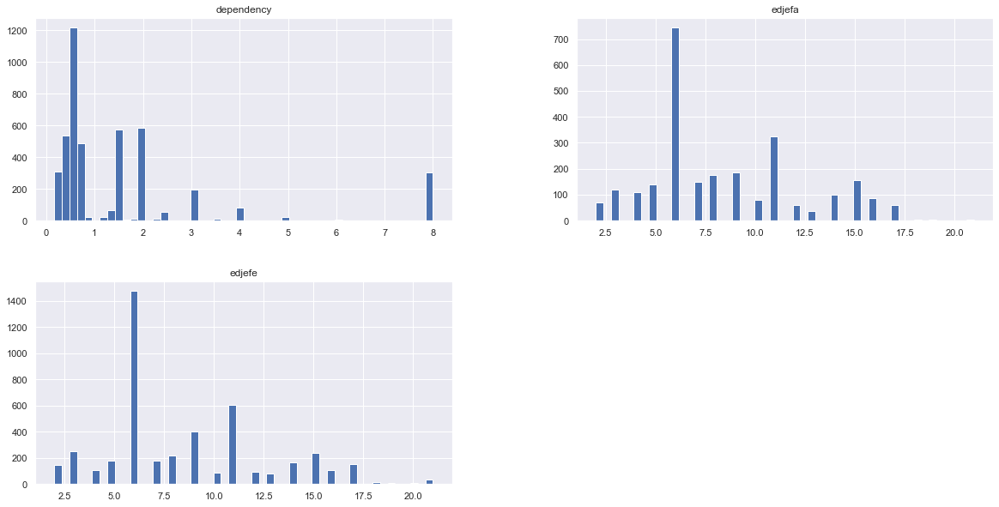

In [194]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None): # more options can be specified also
    family_data = text_data.drop(columns=['Id', 'idhogar'])\
        .replace({'no': np.nan, 'yes': np.nan})\
        .astype(np.float)
    family_data.describe().T
    _ = family_data.hist(figsize=(20, 10), bins=50);

In [407]:
continuous_data.columns

Index(['Id', 'v2a1', 'rooms', 'v18q1', 'r4h1', 'r4h2', 'r4h3', 'r4m1', 'r4m2',
       'r4m3', 'r4t1', 'r4t2', 'r4t3', 'tamhog', 'tamviv', 'escolari',
       'rez_esc', 'hhsize', 'elimbasu5', 'idhogar', 'hogar_nin', 'hogar_adul',
       'hogar_mayor', 'hogar_total', 'dependency', 'edjefe', 'edjefa',
       'meaneduc', 'bedrooms', 'overcrowding', 'qmobilephone', 'age',
       'SQBescolari', 'SQBage', 'SQBhogar_total', 'SQBedjefe', 'SQBhogar_nin',
       'SQBovercrowding', 'SQBdependency', 'SQBmeaned', 'agesq', 'Target',
       'head_is_fem'],
      dtype='object')

,count,mean,std,min,25%,50%,75%,max
v2a1,2180.0,161842.673394,143735.450025,0.0000,77000.000000,126259.000000,200000.000000,2353477.0
rooms,7645.0,4.955134,1.462134,1.0000,4.000000,5.000000,6.000000,11.0
v18q1,1783.0,1.407179,0.772125,1.0000,1.000000,1.000000,2.000000,6.0
r4h1,7645.0,0.384696,0.679714,0.0000,0.000000,0.000000,1.000000,5.0
r4h2,7645.0,1.559712,1.025320,0.0000,1.000000,1.000000,2.000000,8.0
r4h3,7645.0,1.944408,1.179882,0.0000,1.000000,2.000000,3.000000,8.0
r4m1,7645.0,0.400523,0.696068,0.0000,0.000000,0.000000,1.000000,6.0
r4m2,7645.0,1.661216,0.929525,0.0000,1.000000,1.000000,2.000000,6.0
r4m3,7645.0,2.061740,1.203456,0.0000,1.000000,2.000000,3.000000,8.0
r4t1,7645.0,0.785219,1.052851,0.0000,0.000000,0.000000,1.000000,7.0


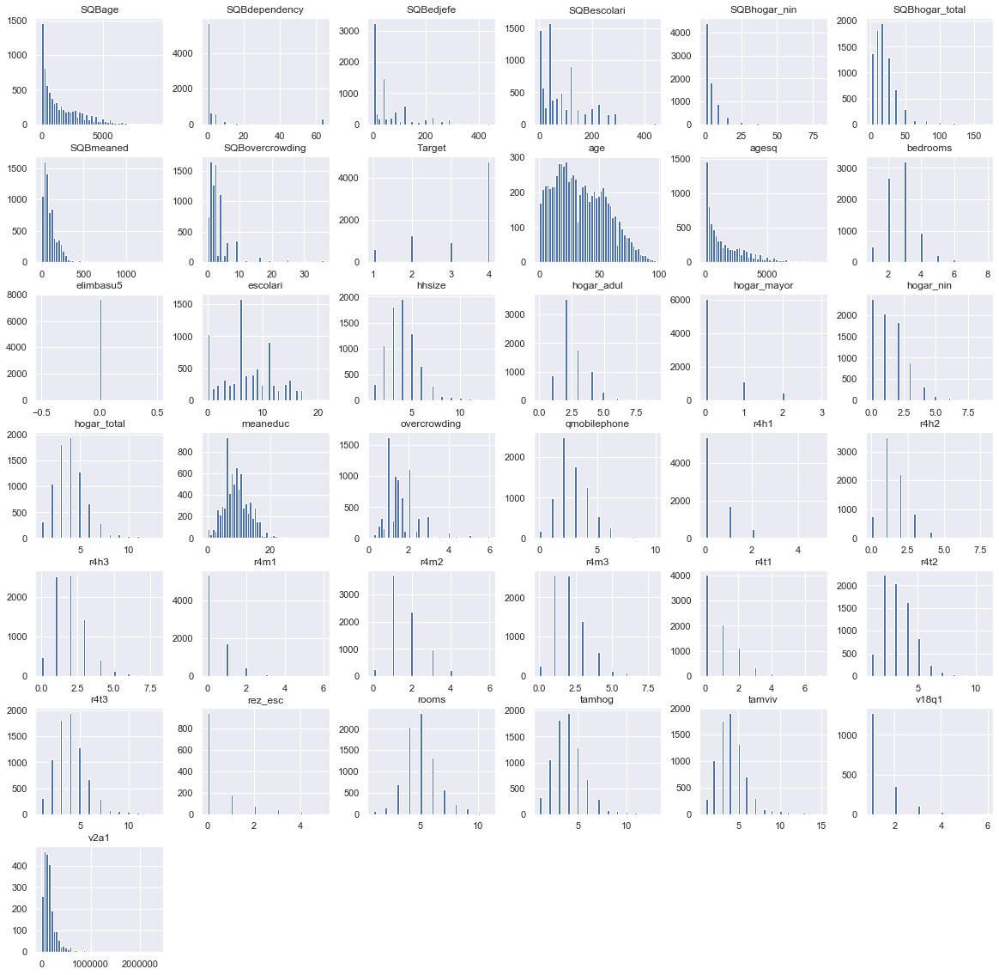

In [191]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None): # more options can be specified also
    continuous_data.describe().T
    _ = continuous_data.hist(figsize=(20, 20), bins=50);

### Comments:
All variables with the prefix SQB are squared transformation of an existing.
One can notice some duplicates. ex agesq and SQBage.

Besides the monthly rent (v2a1) that mat require a transform to go back to a more gaussian distribution, most features do not show any pathological behaviour or presence of outliers. Filtering out the squared features may be helpful, let's keep this in mind.
Finally, one notices that elibaum5 should be a binary feature.

In [ ]:
continuous_data.drop('Target')

In [238]:
continuous_data_no_sq = continuous_data.loc[:, ~continuous_data.columns.str.startswith('SQB')]
# continuous_data_no_sq = pd.concat((continuous_data_no_sq, dataset['Target']), axis='columns')

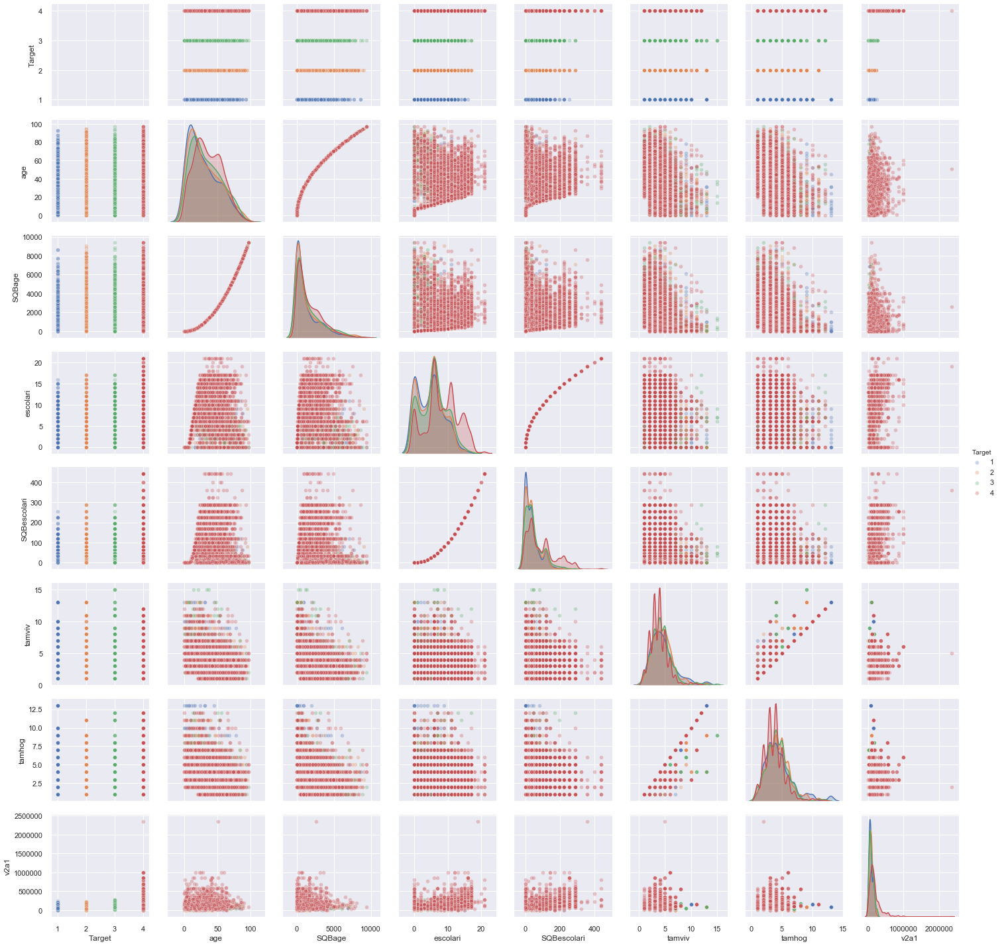

In [419]:
sns.pairplot(continuous_data[['Target', 'age', 'SQBage', 'escolari', 'SQBescolari', 'tamviv', 'tamhog', 'v2a1']], hue='Target', plot_kws={'alpha': 0.3})

# Comments:
Besides the correlation already flagged by the profiling report, it doesn't appear to be any clear pattern in the few features plotted.

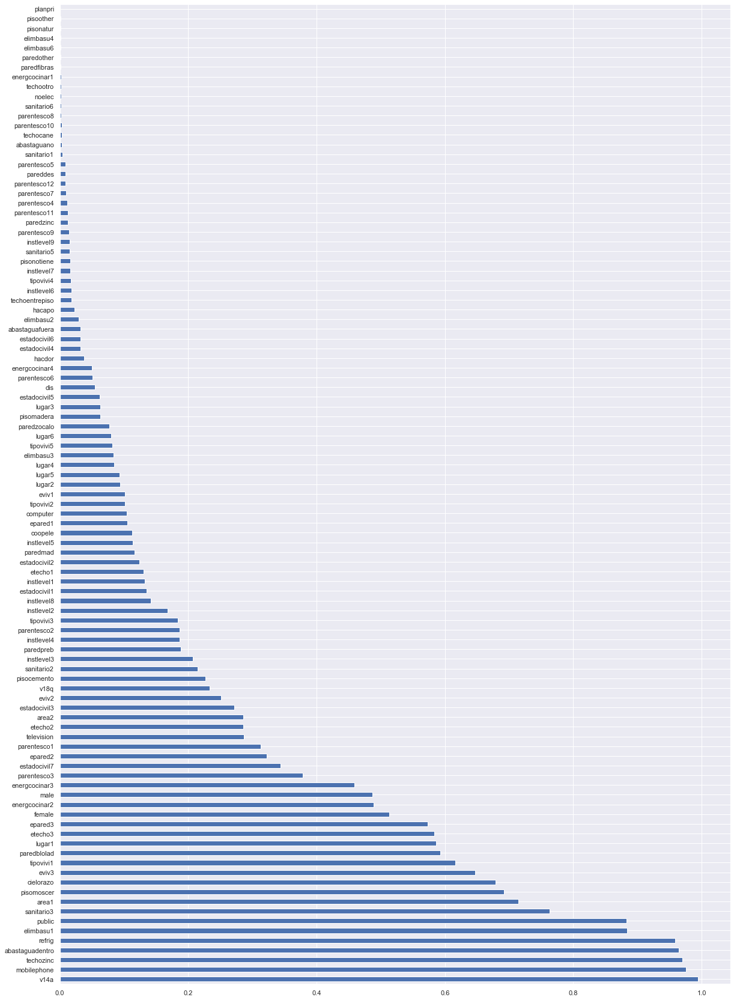

In [195]:
pct_cat_data = (categorical_data.sum() / categorical_data.count()).sort_values(ascending=False)
_ = pct_cat_data.plot(kind='barh', figsize=(20, 30))

# Comments:
While most households appear to be living in a dwelling with zinc ceiling it seems that more than 3/4 of households have ubiquitous access to mobile phones and some bare necessity amenities
like bathrooms, fridges and electrity.

We can also notice from this graph and the data description that many of the attributes could actually be aggregated in a single categorical variable. For ex. All sanitario* columns refer to different value of the same observable: the state of the toilets available in the dwelling. We'll need to insure those are treated jointly when doing feature selection.

# III - Analysis at household level

In [391]:
household = dataset.copy()
household = household[household['parentesco1'] == 1]
household['is_vulnerable'] = household['Target'] != 4

In [342]:

dirty_cols = ['dependency', 'edjefe', 'edjefa']
household.loc[:, dirty_cols] = household[dirty_cols].replace({'no': np.nan, 'yes': np.nan})\
        .astype(np.float)

In [306]:
categorical_data = dataset.loc[:, categorical_cols]
household_continuous_data = household.loc[:, ~household.columns.isin(categorical_cols)]


In [311]:
household.groupby('Target').count()['Id']

Target
1     186
2     347
3     278
4    1579
Name: Id, dtype: int64

In [393]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None): # more options can be specified also
    household.groupby('Target').describe(include=np.float).T

Target                             1              2              3  \
v2a1            count      34.000000      72.000000      63.000000   
                mean    79286.088235   90523.416667   96264.460317   
                std     55264.234858   51193.774620   63977.809755   
                min         0.000000       0.000000   13000.000000   
                25%     50000.000000   50000.000000   50000.000000   
                50%     65000.000000   90000.000000   80000.000000   
                75%     86750.000000  120000.000000  137500.000000   
                max    249896.000000  225000.000000  270000.000000   
v18q1           count      11.000000      25.000000      27.000000   
                mean        1.818182       1.320000       1.185185   
                std         0.981650       0.556776       0.622466   
                min         1.000000       1.000000       1.000000   
                25%         1.000000       1.000000       1.000000   
                50%         2.000000       1.000000       1.000000   
                75%         2.000000       2.000000       1.000000   
                max         4.000000       3.000000       4.000000   
rez_esc         count       0.000000       1.000000       0.000000   
                mean             NaN       4.000000            NaN   
                std              NaN            NaN            NaN   
                min              NaN       4.000000            NaN   
                25%              NaN       4.000000            NaN   
                50%              NaN       4.000000            NaN   
                75%              NaN       4.000000            NaN   
                max              NaN       4.000000            NaN   
meaneduc        count     186.000000     347.000000     278.000000   
                mean        6.795699       7.108501       6.914748   
                std         3.534897       4.006436       3.340188   
                min         0.000000       0.000000       0.000000   
                25%         4.500000       5.000000       5.000000   
                50%         6.000000       6.000000       6.000000   
                75%         9.000000       9.000000       9.000000   
                max        21.000000      23.000000      22.000000   
overcrowding    count     186.000000     347.000000     278.000000   
                mean        1.700717       1.664505       1.472722   
                std         0.941912       0.935540       0.820349   
                min         0.333333       0.250000       0.250000   
                25%         1.000000       1.000000       1.000000   
                50%         1.500000       1.500000       1.333333   
                75%         2.000000       2.000000       2.000000   
                max         6.000000       6.000000       5.500000   
SQBovercrowding count     186.000000     347.000000     278.000000   
                mean        3.774866       3.643291       2.839461   
                std         4.648687       4.786607       3.666576   
                min         0.111111       0.062500       0.062500   
                25%         1.000000       1.000000       1.000000   
                50%         2.250000       2.250000       1.777778   
                75%         4.000000       4.000000       4.000000   
                max        36.000000      36.000000      30.250000   
SQBdependency   count     186.000000     347.000000     278.000000   
                mean        6.148073       7.650040      10.899941   
                std        14.647365      17.935711      22.816545   
                min         0.000000       0.000000       0.000000   
                25%         0.250000       0.250000       0.250000   
                50%         1.000000       1.000000       1.000000   
                75%         4.000000       4.000000       2.250000   
                max        64.000000      64.000000      64.000000   
SQBmeaned 

In [358]:
def find_column_group(dataset: pd.DataFrame, prefix: str):
    cols = dataset.columns
    return cols[cols.str.startswith(prefix)]

def collapse_cat(dataset: pd.DataFrame, prefix: str, stringify: bool = False):
    cols = find_column_group(dataset, prefix)
    values = (dataset[cols] * np.arange(len(cols))).sum(axis='columns')
    if stringify:
        values = values.astype(str)
    return dataset.assign(**{prefix: values})\
        .drop(columns=cols)

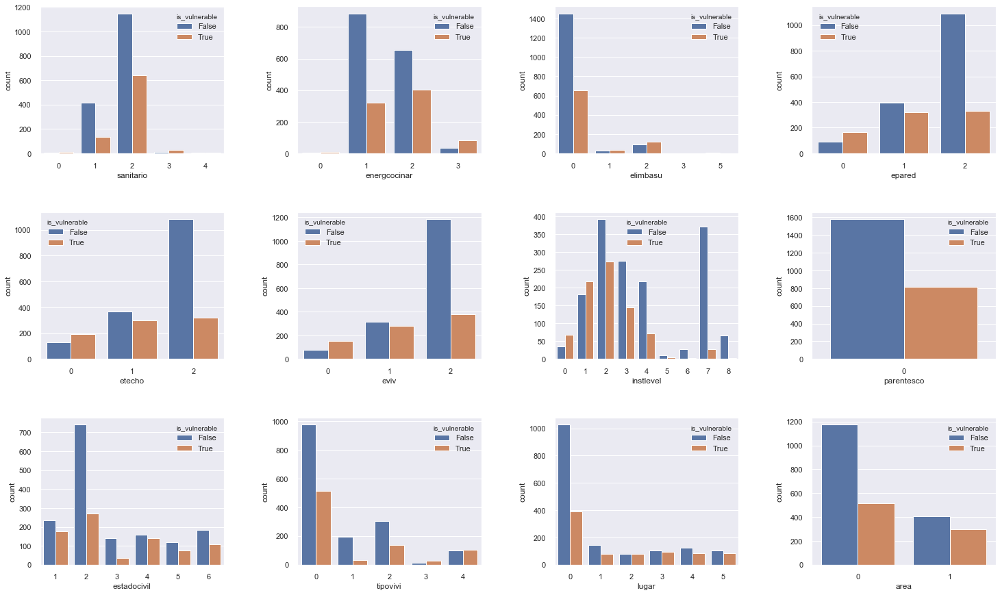

In [396]:
agg_household = household.copy()
cat_cols = ['sanitario', 'energcocinar','elimbasu', 'epared', 'etecho', 'eviv', 'instlevel', 'parentesco', 'estadocivil', 'tipovivi', 'lugar', 'area']
fig = plt.figure(figsize=(25, 15))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i, col in enumerate(cat_cols):
    agg_household = collapse_cat(household,col)
    ax = fig.add_subplot(3, 4, i+1)
    ax = sns.countplot(x=col, hue='is_vulnerable', data=agg_household)


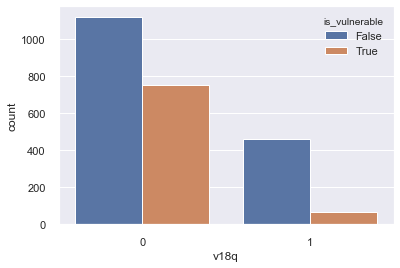

In [403]:
sns.countplot(x='v18q', hue='is_vulnerable', data=agg_household)

### Comments:
* The non vulnerable households are overrepresented in the Central Region. A quick google search confirms that this is the main economic engine of the country.
* likewise non vulnerable are overrepresented in the urban areas.
* Vulnerable households tends to burn or bury their rubbish. Both those behaviour are likely to have negative consequences for their health
* Vulnerables tend to live in precarious or assigned housing.


In [366]:
agg_household.profile_report()